<a href="https://colab.research.google.com/github/lisatwyw/vivarium/blob/main/Pix2Pix_cityscapes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

Adopted from [TF Tutorial](
https://www.tensorflow.org/tutorials/generative/pix2pix)

Datasets to explore with:
- facades  | 29M <-- TF Tutorial
- cityscapes | 99M  <-- this notebook
- maps | 239M
- night2day | 1.9G
- edges2shoes | 2G
- edges2handbags | 8.0G


# Additional resources: 
- [Notebook demo on TPU setup/ init](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/guide/tpu.ipynb)

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

subdir='vision'

try:
  os.mkdir( '/content/drive/My Drive/Colab Notebooks/%s'% subdir )
except: 
  pass  
import os
try:
  os.mkdir( '/content/drive/My Drive/Colab Notebooks/%s'% subdir )
except:
  pass  
import os
os.chdir('/content/drive/My Drive/Colab Notebooks/%s'% subdir )


# !git clone https://github.com/POSTECH-CVLab/PyTorch-StudioGAN.git


Mounted at /content/drive


In [3]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display


dataset_name = "cityscapes"

_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

import os
if os.path.exists('/root/.keras/datasets/cityscapes') == False:

  path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name


103456768/103441232 [==============================] - 50s 0us/step


In [4]:
PATH

list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/cityscapes'),
 PosixPath('/root/.keras/datasets/cityscapes.tar.gz')]

# Two libraries to load

1. tf
2. cv2



(256, 512, 3)


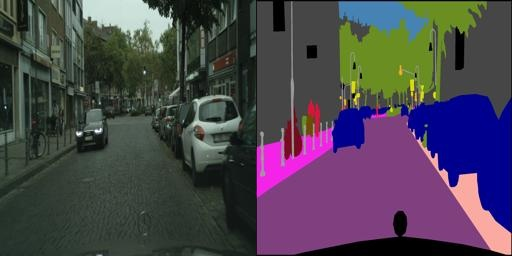

In [5]:
path=str(PATH / 'train/100.jpg')

sample_image = tf.io.read_file( path )
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread( path, cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

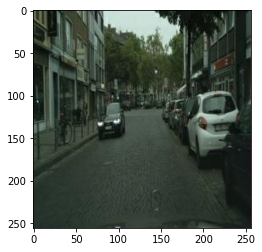

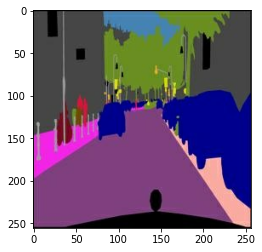

In [6]:

def load_img_mask(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

mask, inp = load_img_mask(str(PATH / 'train/100.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(mask/ 255.0)


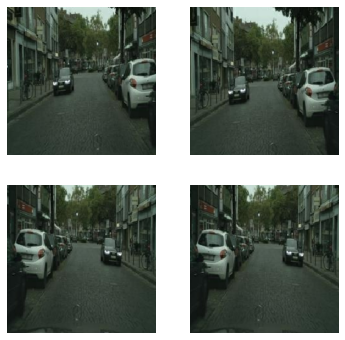

In [7]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256


def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]


def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image
  
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image


plt.figure(figsize=(6, 6))
for i in range(4):
  rj_mask, rj_real = random_jitter(inp, mask )
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_mask / 255.0)
  plt.axis('off')
plt.show()


# Preparing the training and test datasets 
Training image set: applies random jitter
Test image: do not apply random jitter

In [8]:
def load_image_train(image_file):
  input_image, real_image = load_img_mask(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load_img_mask(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image


train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
  
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)


In [9]:

def DownSampler2(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add( tf.keras.layers.DepthwiseConv2D(filters, size,  padding='same', kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

dsampler2 = DownSampler2(3, [2, 2] , apply_batchnorm=True )
d_result = dsampler2( tf.expand_dims(inp, 0) )

dsampler2.summary()
print( '\n\nInput to output sizes:', inp.shape,  '->', d_result.shape )




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d (Depthwise  (1, 128, 128, 3)         27        
 Conv2D)                                                         
                                                                 
 batch_normalization (BatchN  (1, 128, 128, 3)         12        
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (1, 128, 128, 3)          0         
                                                                 
Total params: 39
Trainable params: 33
Non-trainable params: 6
_________________________________________________________________


Input to output sizes: (256, 256, 3) -> (1, 128, 128, 3)


In [10]:
# Spatial Separable Convolutions, 2 kernels: 4x1, 1x4, e.g. Sobel kernel for edge detection 

# Depthwise separable:  2 kernels: pointwise (along spatial dimension) and depthwise (along channel dimension)

# depthwise gives output size with 3 kernels of 4 x 1 x 1:
print( 'Output size', 256//4, 256//4, 3 )

# C_out*C_out*C_in  = # params
1*1*3 
2*2*3
3*3*3
4*4*3
5*5*3



Output size 64 64 3


75

In [11]:

def UpSampler(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

usampler = UpSampler(3, 4)
up_result = usampler(d_result)
print(up_result.shape)

usampler.summary()


(1, 256, 256, 3)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose (Conv2DTra  (1, 256, 256, 3)         144       
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (1, 256, 256, 3)         12        
 hNormalization)                                                 
                                                                 
 re_lu (ReLU)                (1, 256, 256, 3)          0         
                                                                 
Total params: 156
Trainable params: 150
Non-trainable params: 6
_________________________________________________________________


In [12]:
# bottom: C_out* C_in* K* K 
3*3*4*4

144

In [13]:
print( 75//2 +1, 245//2+1)

38 123


In [14]:

def DownSampler(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add( tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result


dsampler = DownSampler(3, 4)
d_result = dsampler( tf.expand_dims(inp, 0) )


print( dsampler.summary() )
print( '\n\nInput to output sizes:', inp.shape,  '->', d_result.shape )
 


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (1, 128, 128, 3)          144       
                                                                 
 batch_normalization_2 (Batc  (1, 128, 128, 3)         12        
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (1, 128, 128, 3)          0         
                                                                 
Total params: 156
Trainable params: 150
Non-trainable params: 6
_________________________________________________________________
None


Input to output sizes: (256, 256, 3) -> (1, 128, 128, 3)


In [15]:
'''Param #: C_in * C_out * K*K'''

3*3*4*4

144

In [16]:

''' 3 channels *2 params ''' # (gamma, beta)

6+6 # 6 + 6 non-trainable 

12

In [17]:
144+12

156

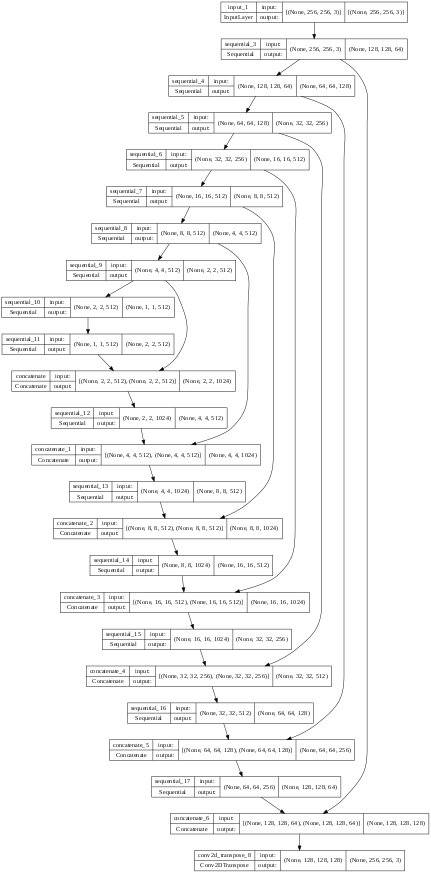

In [18]:
def Generator( depthwise=False, apply_batchnorm=False,  apply_dropout= True ):
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  OUTPUT_CHANNELS=3

  if depthwise:
      down_stack = [
      DownSampler2(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
      DownSampler2(128, 4),  # (batch_size, 64, 64, 128)
      DownSampler2(256, 4),  # (batch_size, 32, 32, 256)
      DownSampler2(512, 4),  # (batch_size, 16, 16, 512)
      DownSampler2(512, 4),  # (batch_size, 8, 8, 512)
      DownSampler2(512, 4),  # (batch_size, 4, 4, 512)
      DownSampler2(512, 4),  # (batch_size, 2, 2, 512)
      DownSampler2(512, 4),  # (batch_size, 1, 1, 512)
    ]
  else:
    down_stack = [
      DownSampler(64, 4, apply_batchnorm=False),  # (256/4*2=128, 128, 64)
      DownSampler(128, 4),  # (128/4*2=64, 64, 128)
      DownSampler(256, 4),  # (64/4*2=32, 32, 256)
      DownSampler(512, 4),  # (32/4*2=16, 16, 512)
      DownSampler(512, 4),  # (16/4*2*8, 8, 512)
      DownSampler(512, 4),  # (8/4*2=4, 4, 512)
      DownSampler(512, 4),  # (4/4*2=2, 2, 512)
      DownSampler(512, 4),  # (2/4*2=1, 1, 1, 512)
    ]

  up_stack = [
    UpSampler(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    UpSampler(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    UpSampler(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    UpSampler(512, 4),  # (batch_size, 16, 16, 1024)
    UpSampler(256, 4),  # (batch_size, 32, 32, 512)
    UpSampler(128, 4),  # (batch_size, 64, 64, 256)
    UpSampler(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator(depthwise=False )
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=32)

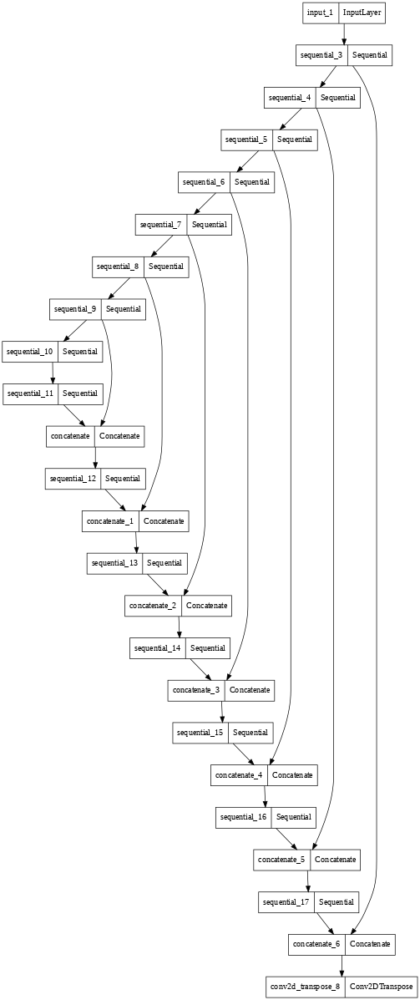

In [19]:
tf.keras.utils.plot_model(generator, show_shapes=False, dpi=50)

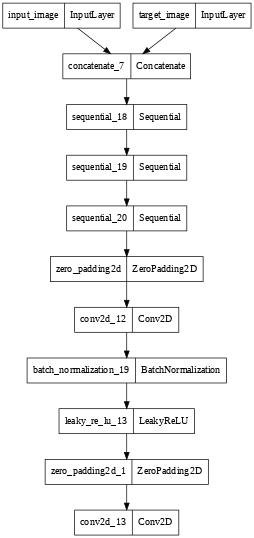

In [20]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = DownSampler(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = DownSampler(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = DownSampler(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)


discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=False, dpi=50)


In [21]:


LAMBDA = 100

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss
  

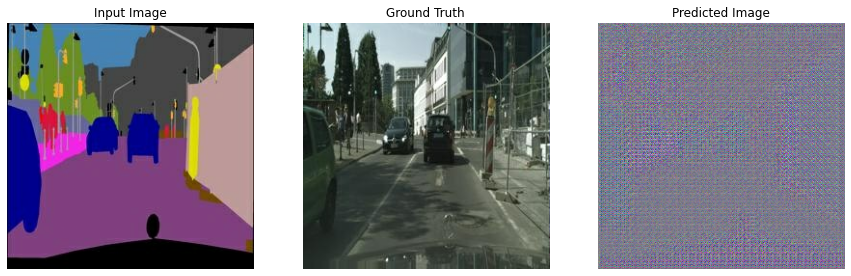

In [22]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)



In [23]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [24]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)


def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)



In [25]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}


<IPython.core.display.Javascript object>

Time taken for 1000 steps: 95.67 sec



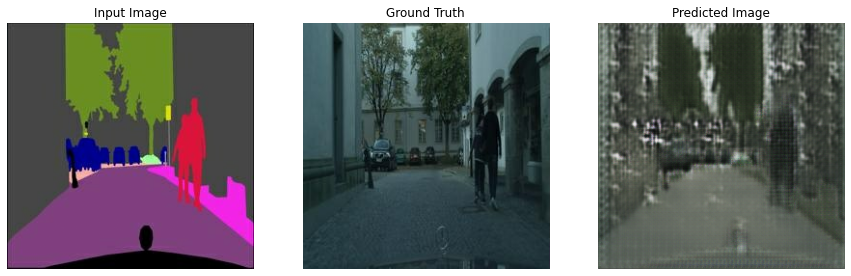

Step: 1k
....................................................................................................

In [30]:
fit(train_dataset, test_dataset, steps=2000)


Time taken for 1000 steps: 98.08 sec



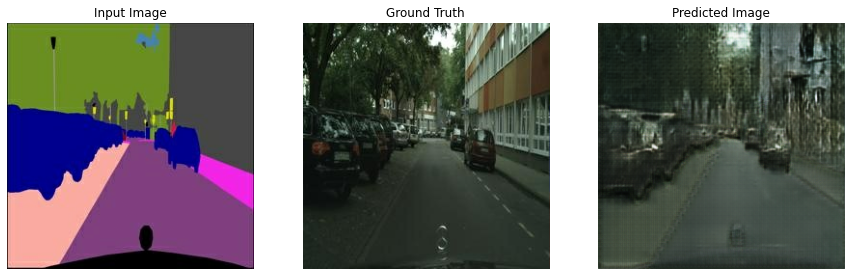

Step: 9k
....................................................................................................

In [31]:
fit(train_dataset, test_dataset, steps=10000)

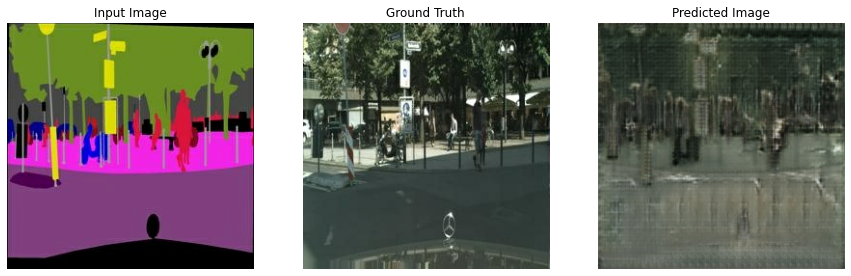

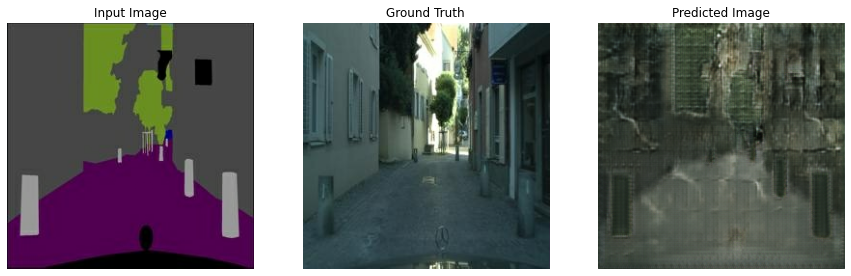

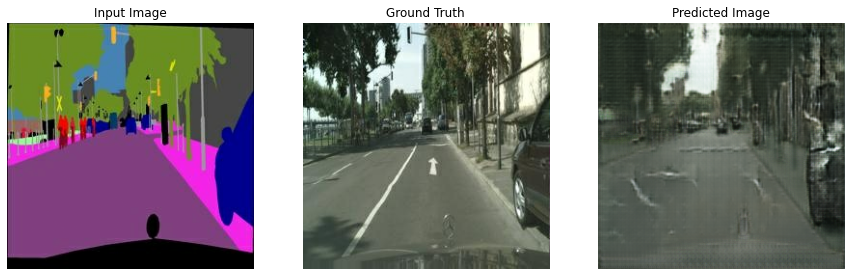

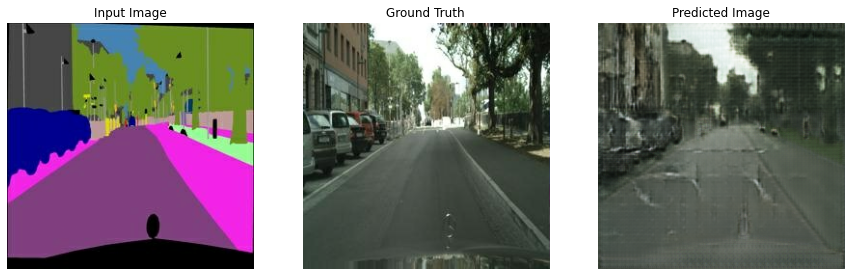

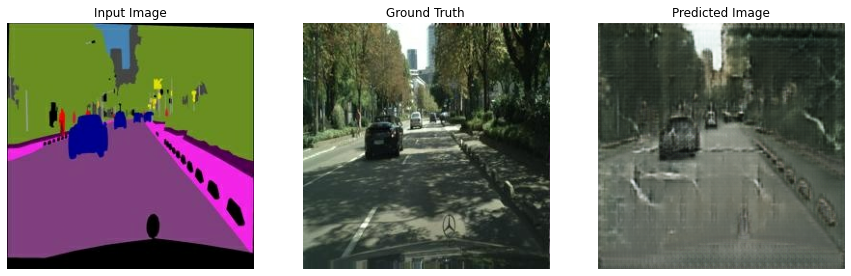

In [33]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)


In [46]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")


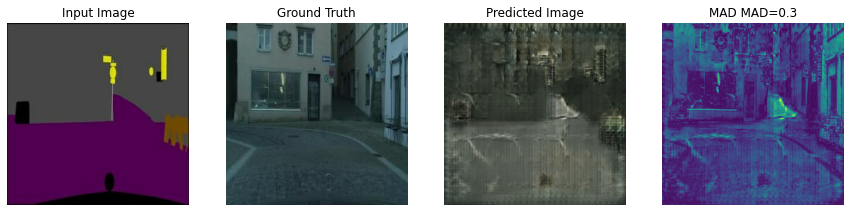

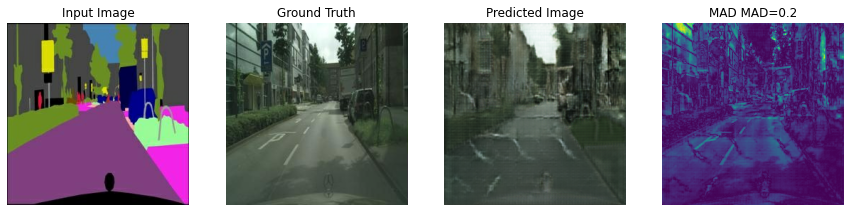

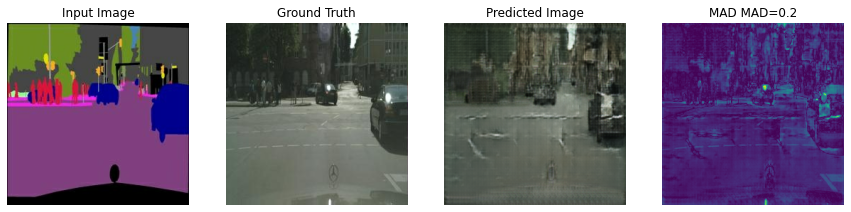

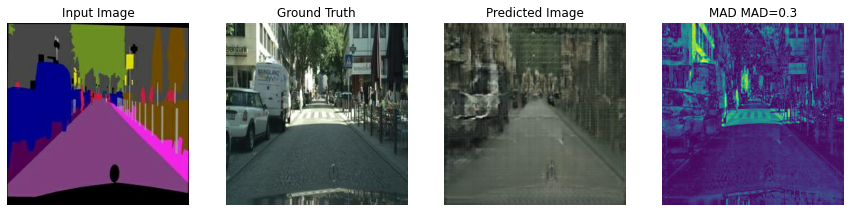

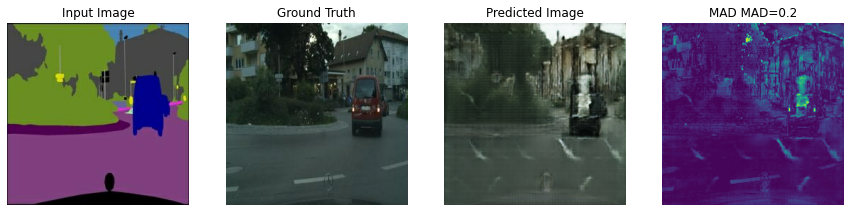

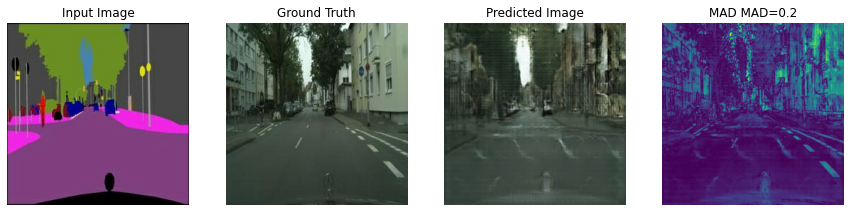

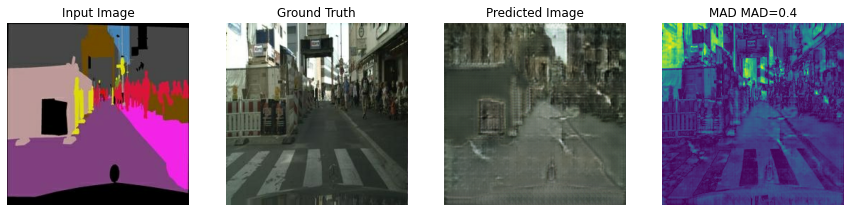

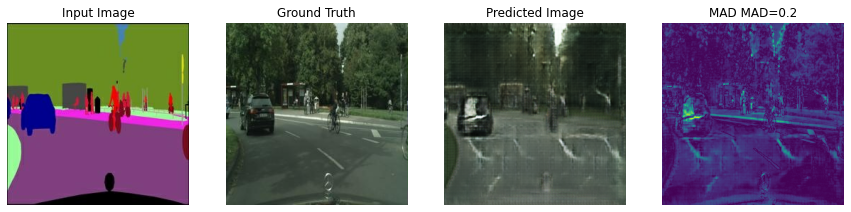

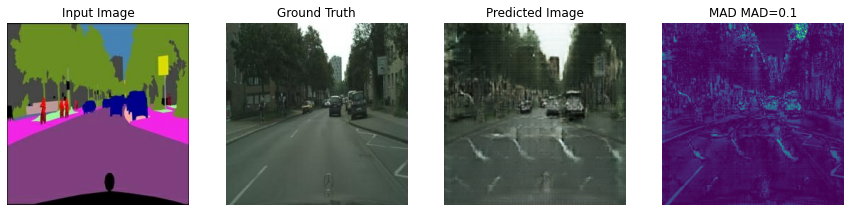

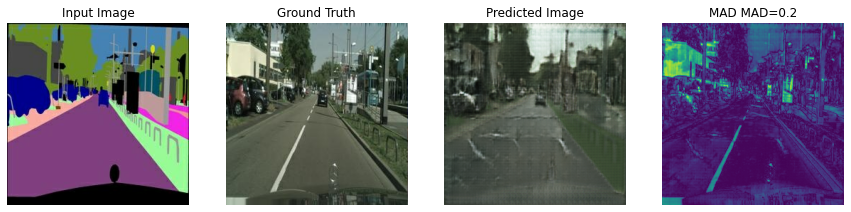

In [266]:
def generate_images( gen, test_input, tar):
  prediction = gen(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image', 'MAD' ]

  for i in range(4):
    plt.subplot(1, 4, i+1)
    if i==3:
      madi = np.mean( np.abs( tar[0] - prediction[0] ), axis=-1) 
      plt.imshow( madi * 0.5 + 0.5) 
      plt.title( title[i] + ' MAD=%.1f'%( np.mean(madi) ) )

    else:
      plt.title( title[i] )
    
    # Getting the pixel values in the [0, 1] range to plot.
    if i<3:
      plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

for example_input, example_target in test_dataset.take(10):
  generate_images(generator, example_input, example_target)


